[Neural style transfer Tutorial](https://www.tensorflow.org/tutorials/generative/style_transfer) 코드 참고

```
@misc{gatys2015neural,
      title={A Neural Algorithm of Artistic Style}, 
      author={Leon A. Gatys and Alexander S. Ecker and Matthias Bethge},
      year={2015},
      eprint={1508.06576},
      archivePrefix={arXiv},
      primaryClass={cs.CV}
}
```

In [1]:
import PIL.Image
import time

import numpy as np
import tensorflow as tf

from PIL import Image
import IPython.display as display
import matplotlib.pyplot as plt

CONTENT_IMG_PATH = './images/000034.jpeg'
STYLE_IMG_PATH = './images/vincent_portrait.jpg'

# 1. Data 

In [2]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)
 
    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    
    plt.imshow(image)
    if title:
        plt.title(title)

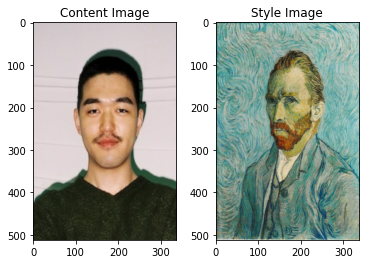

In [3]:
# 불러온 이미지 시각화
content_image = load_img(CONTENT_IMG_PATH)
style_image = load_img(STYLE_IMG_PATH)

new_shape = (512, 337)

content_image = tf.image.resize(content_image, new_shape)
style_image = tf.image.resize(style_image, new_shape)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [4]:
print(content_image.shape)
print(style_image.shape)

(1, 512, 337, 3)
(1, 512, 337, 3)


In [5]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

# 2. Model
## 2.1. Load Pretrained Model

In [6]:
# VGG19 모델
model = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
# for layer in model.layers:
#     print(layer.name)

In [7]:
model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

## 2.2. Build Model

In [8]:
# Select layers from the list
# content_layers = ['block4_conv1']
content_layers = ['block3_conv1']
style_layers = ['block1_conv2', 'block2_conv2', 'block3_conv2', 'block4_conv2', 'block5_conv2']

In [9]:
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/(num_locations)

def build_model(layer_names):
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = tf.keras.Model([vgg.input], outputs)
    return model

class MiddleModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(MiddleModel, self).__init__()
        self.vgg = build_model(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        
    def call(self, inputs):
        # Preprocessed numpy.array or a tf.Tensor with type float32
        inputs = inputs*255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        
        style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                          outputs[self.num_style_layers:])
        
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]
        
        style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}
        content_dict = {content_name: value for content_name, value 
                        in zip(self.content_layers, content_outputs)}
        
        return {'content': content_dict, 'style': style_dict}

In [10]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)
    
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name])**2) 
                           for name in style_outputs.keys()])
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name])**2) 
                             for name in content_outputs.keys()])
    
    content_weight=1e-3
    style_weight=1e4
 
    style_loss *= style_weight / num_style_layers
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    
    flattened_style_loss = tf.reduce_sum(style_loss)
    flattened_content_loss = tf.reduce_sum(content_loss)
  
    return loss 

def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [11]:
extractor = MiddleModel(style_layers, content_layers)
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

# 3. Train Model

=============================  0: epoch =============================
99%

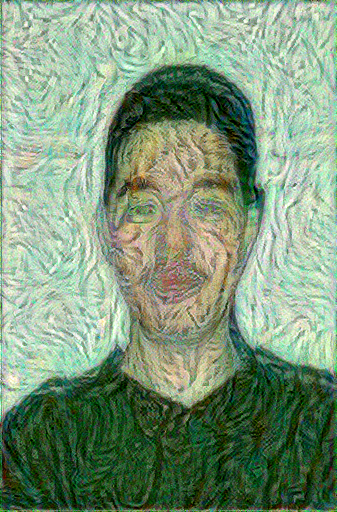

Train step: 100
=============================  1: epoch =============================
99%

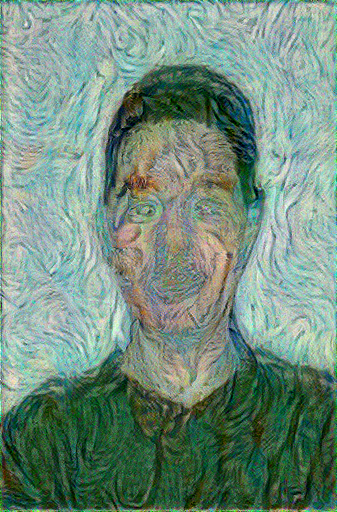

Train step: 200
=============================  2: epoch =============================
99%

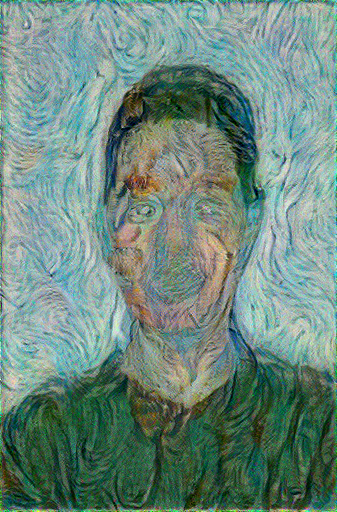

Train step: 300
=============================  3: epoch =============================
99%

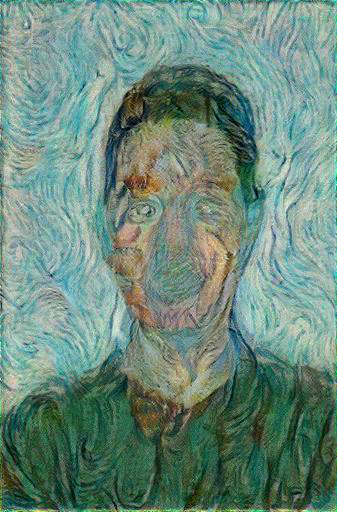

Train step: 400
=============================  4: epoch =============================
99%

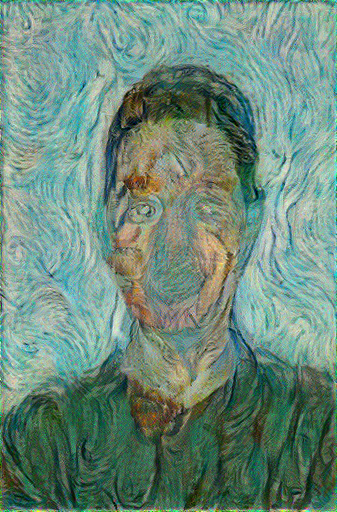

Train step: 500
=============================  5: epoch =============================
99%

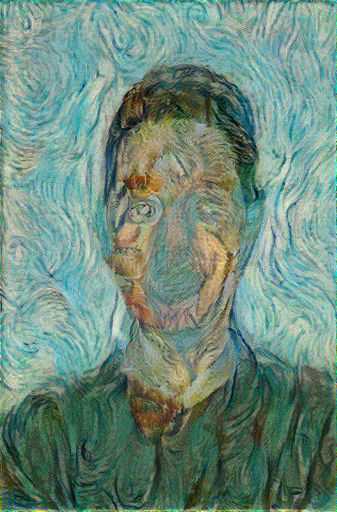

Train step: 600
=============================  6: epoch =============================
99%

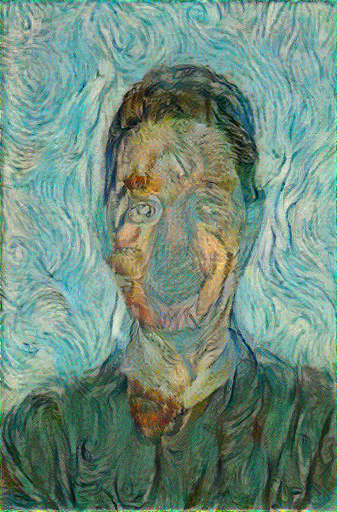

Train step: 700
=============================  7: epoch =============================
99%

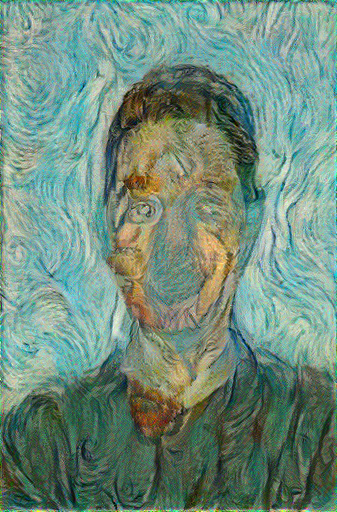

Train step: 800
=============================  8: epoch =============================
99%

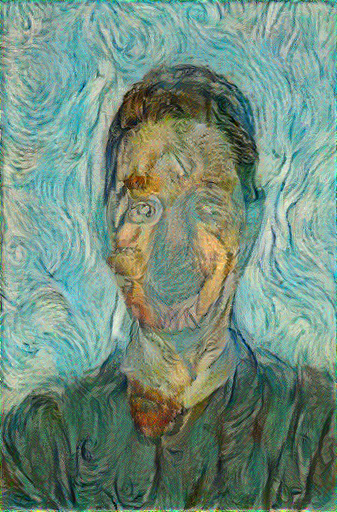

Train step: 900
=============================  9: epoch =============================
99%

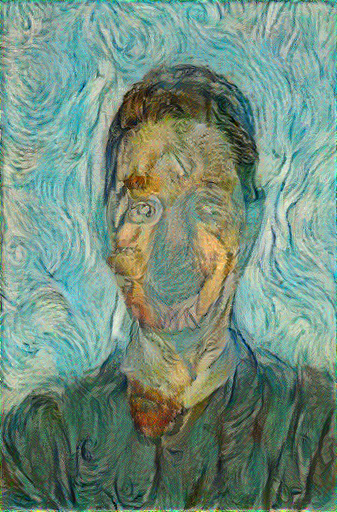

Train step: 1000
=============================  10: epoch =============================
99%

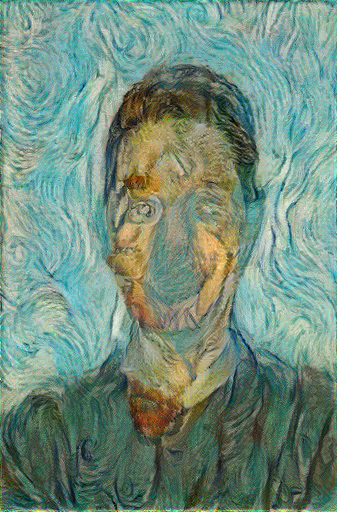

Train step: 1100
=============================  11: epoch =============================
99%

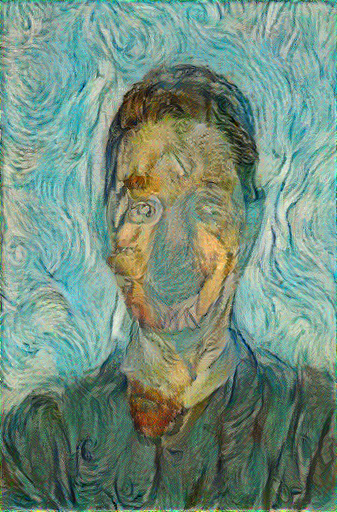

Train step: 1200
=============================  12: epoch =============================
99%

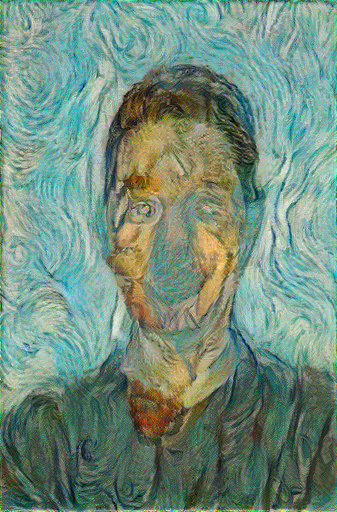

Train step: 1300
=============================  13: epoch =============================
99%

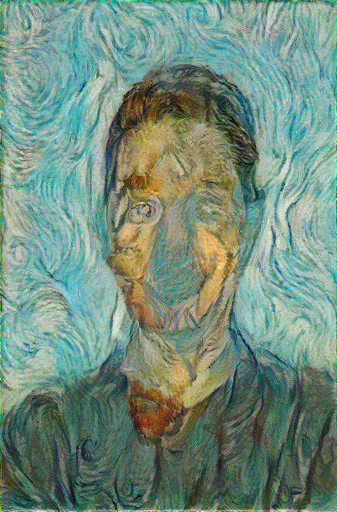

Train step: 1400
=============================  14: epoch =============================
99%

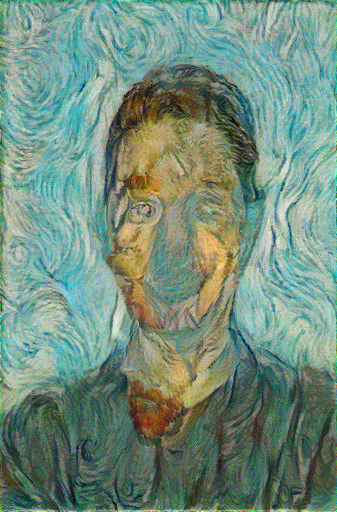

Train step: 1500
=============================  15: epoch =============================
99%

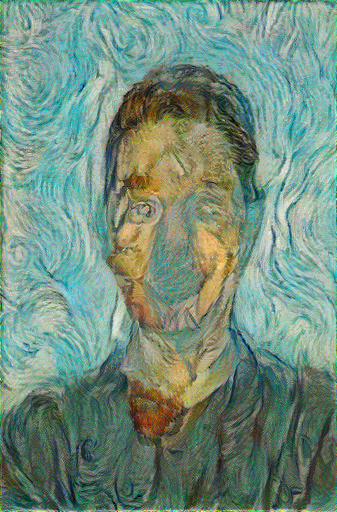

Train step: 1600
=============================  16: epoch =============================
99%

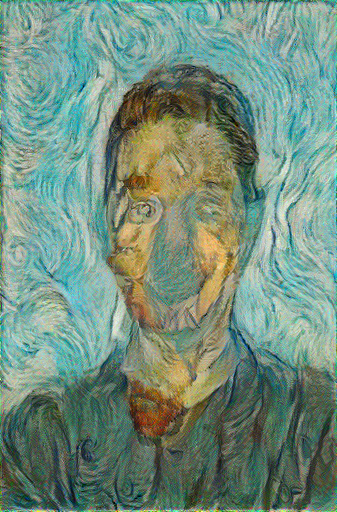

Train step: 1700
=============================  17: epoch =============================
99%

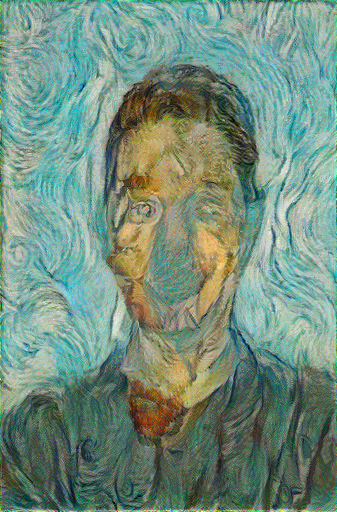

Train step: 1800
=============================  18: epoch =============================
99%

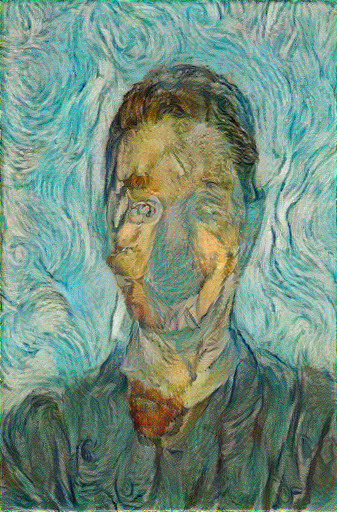

Train step: 1900
=============================  19: epoch =============================
99%

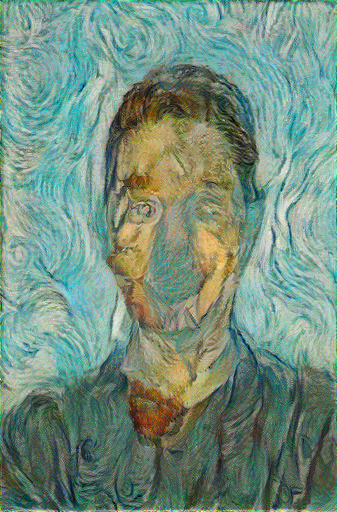

Train step: 2000
=============================  20: epoch =============================
99%

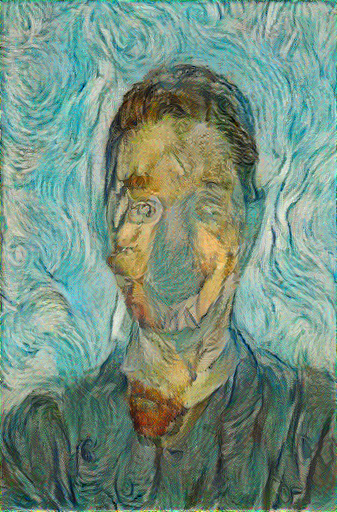

Train step: 2100
=============================  21: epoch =============================
99%

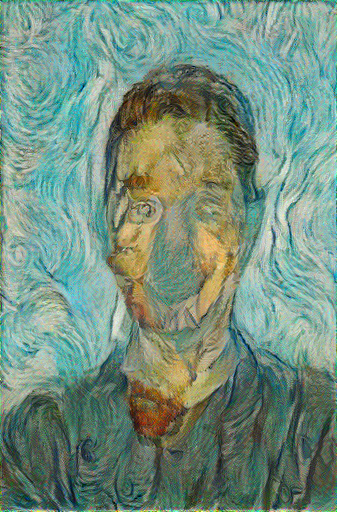

Train step: 2200
=============================  22: epoch =============================
99%

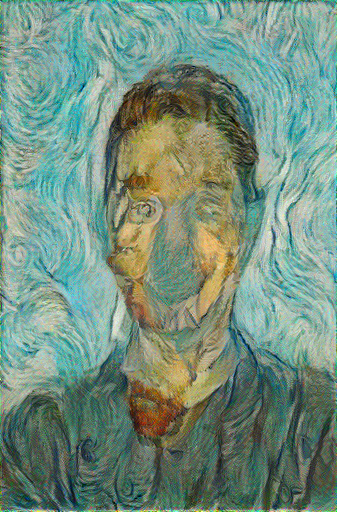

Train step: 2300
=============================  23: epoch =============================
99%

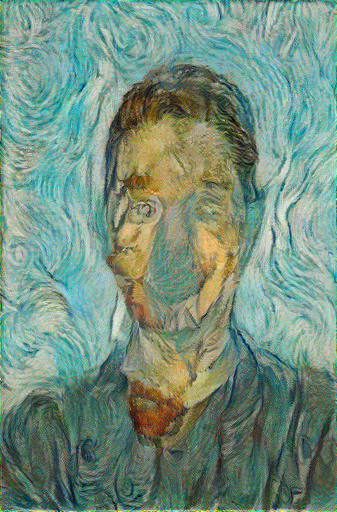

Train step: 2400
=============================  24: epoch =============================
99%

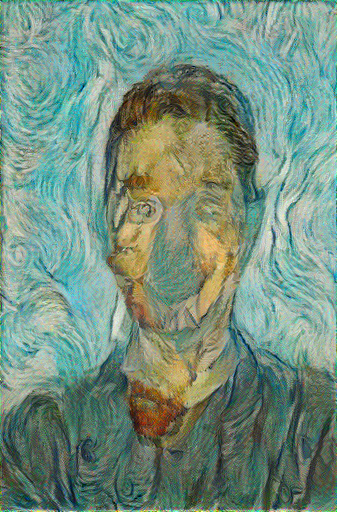

Train step: 2500
=============================  25: epoch =============================
99%

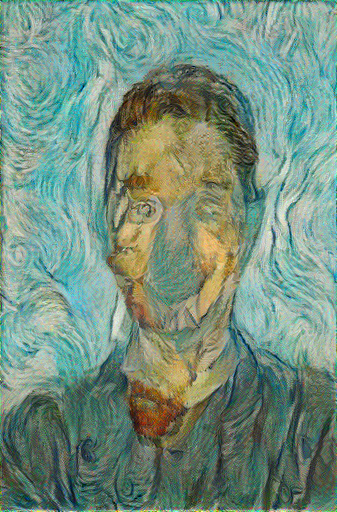

Train step: 2600
=============================  26: epoch =============================
99%

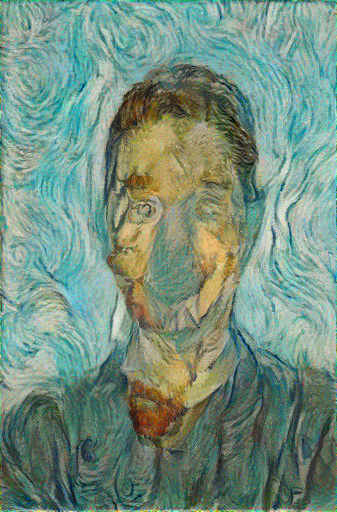

Train step: 2700
=============================  27: epoch =============================
99%

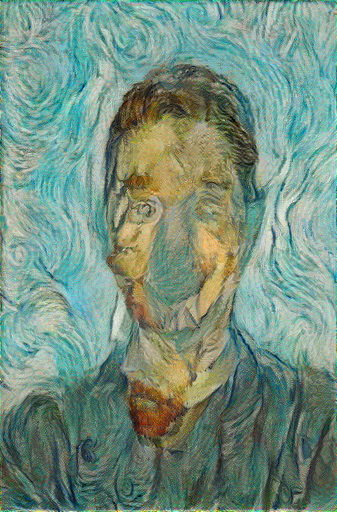

Train step: 2800
=============================  28: epoch =============================
99%

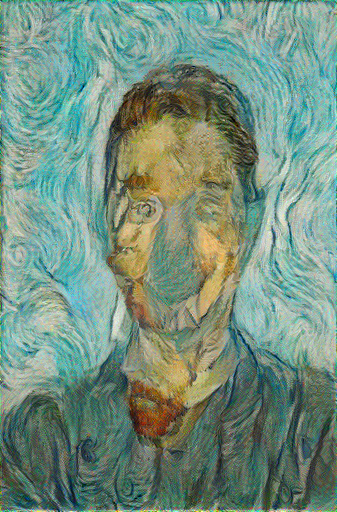

Train step: 2900
=============================  29: epoch =============================
99%

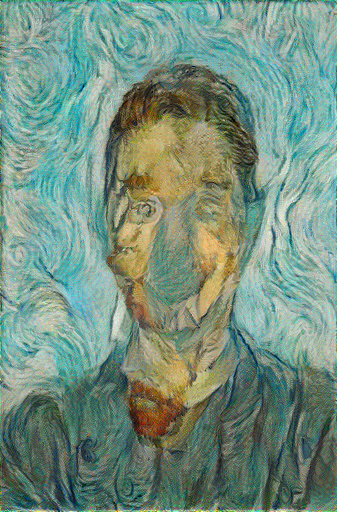

Train step: 3000
Total time: 215.8


In [12]:
start = time.time()
epochs = 30
steps_per_epoch = 100
step = 0

image = tf.Variable(content_image)

# Initialize the TensorFlow variable with the generated noise
# style_image_shape = tf.shape(style_image).numpy()
# height, width, channels = style_image_shape[1:]
# # white_noise = tf.random.uniform(shape=(1,height, width, channels), minval=0, maxval=1)
# white_noise = tf.random.uniform((1,height, width, channels), minval=0, maxval=1)
# image = tf.Variable(white_noise, trainable=True, dtype=tf.float32)

for n in range(epochs):
    print(f"=============================  {n}: epoch =============================")
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)
        print(f"\r{m}%", end='', flush=True)

    display.display(tensor_to_image(image))
    print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))